In [2]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
from anndata import AnnData, read_csv
import seaborn as sns
from matplotlib import pyplot as plt
from glob import glob

In [2]:
adata = sc.read("250303.human.fibroblast.subsampled.fineannot.withTimepoint.h5ad") #60000 cells subset

Only considering the two last: ['.withTimepoint', '.h5ad'].
Only considering the two last: ['.withTimepoint', '.h5ad'].


/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [3]:
adata.X.toarray().max()

7.9566774

In [4]:
sc.pp.neighbors(adata, use_rep="X_scvi")
sc.tl.umap(adata)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
adata.obs['pcw'] = pd.Categorical(adata.obs['pcw'])

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


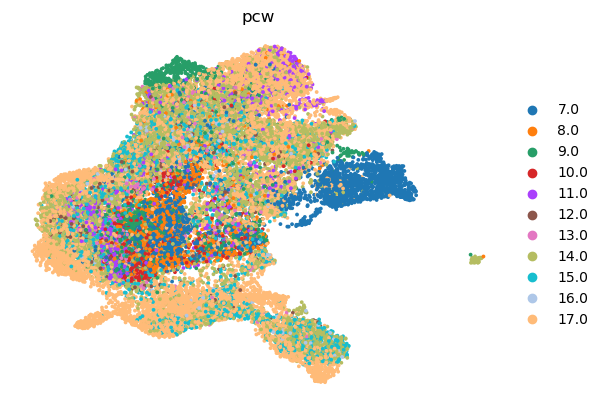

In [6]:
sc.pl.umap(
    adata,
    color=["pcw"],
    frameon=False, size=30
)


In [7]:
sc.set_figure_params(dpi=300)#, facecolor='white')

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


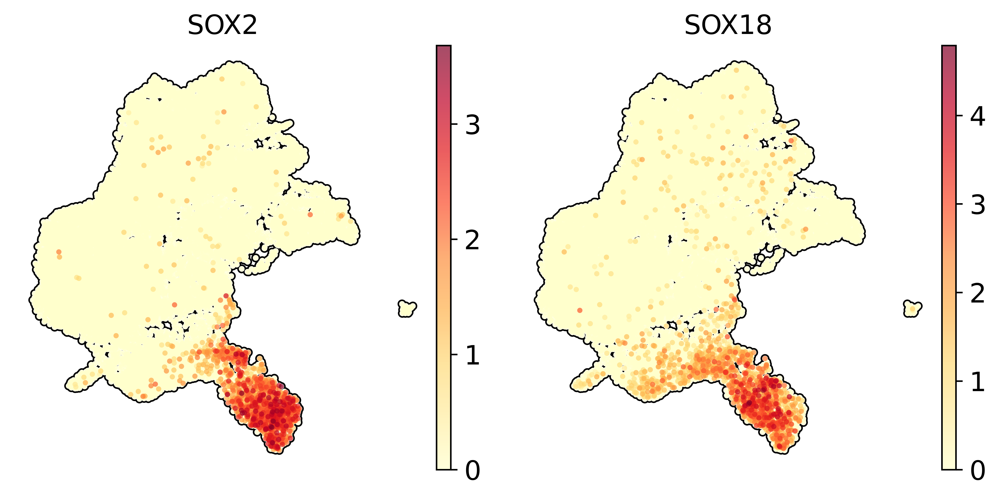

In [11]:
sc.pl.umap(adata, color=['SOX2', 'SOX18'], cmap='YlOrRd', size=30, add_outline=True, use_raw=False, wspace=0.1,frameon=False)# save="250217.sox2.sox18.human.svg")

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/

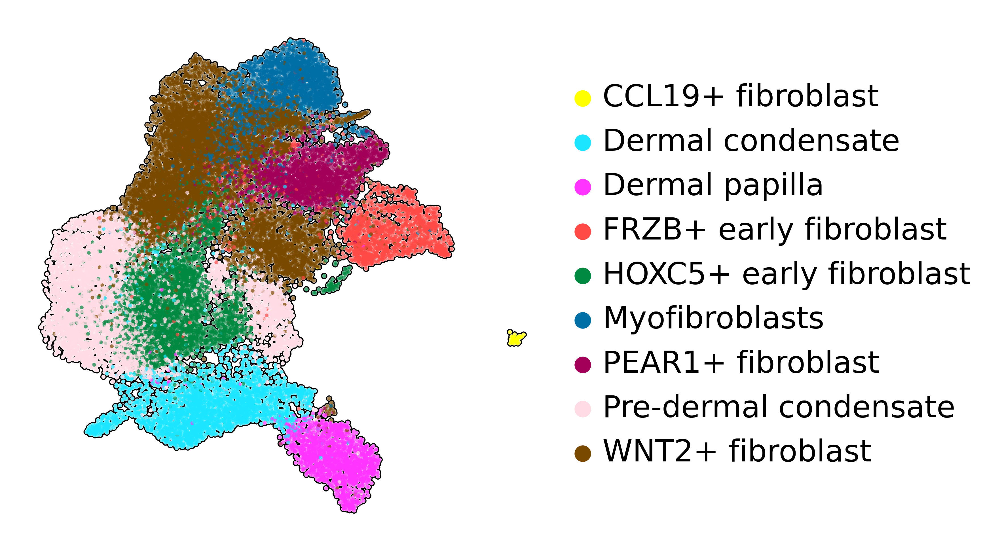

In [12]:
sc.pl.umap(
    adata,
    color=["annotation_fine"], palette=sc.pl.palettes.default_102, size=10, title="", #save="250223.UMAP.original_label.fibroblast.svg",  
    frameon=False, add_outline=True,
)

In [13]:
def cluster_small_multiples(
    adata, clust_key, size=50, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()
    
    # Ensure the cluster key is categorical
    if not pd.api.types.is_categorical_dtype(adata.obs[clust_key]):
        adata.obs[clust_key] = adata.obs[clust_key].astype("category")

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        clust_str = str(clust)  # Convert to string to avoid float-related errors
        tmp.obs[clust_str] = adata.obs[clust_key].isin([clust]).astype("category")

        # Ensure color mapping exists
        if clust_key + "_colors" in adata.uns and len(adata.uns[clust_key + "_colors"]) > i:
            tmp.uns[clust_str + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]
        else:
            print(f"Warning: Color mapping for {clust_key} is missing or too short.")

    # Ensure color column names are valid
    color_column_names = adata.obs[clust_key].cat.categories.astype(str).tolist()

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust_str].cat.categories[1:].values,
        color=color_column_names,  # Use valid categorical labels
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        add_outline=True,
        **kwargs,
    )


In [14]:
cluster_small_multiples(adata, "pcw")

/tmp/ipykernel_31166/2459803641.py:7: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata.obs[clust_key]):
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/env

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/

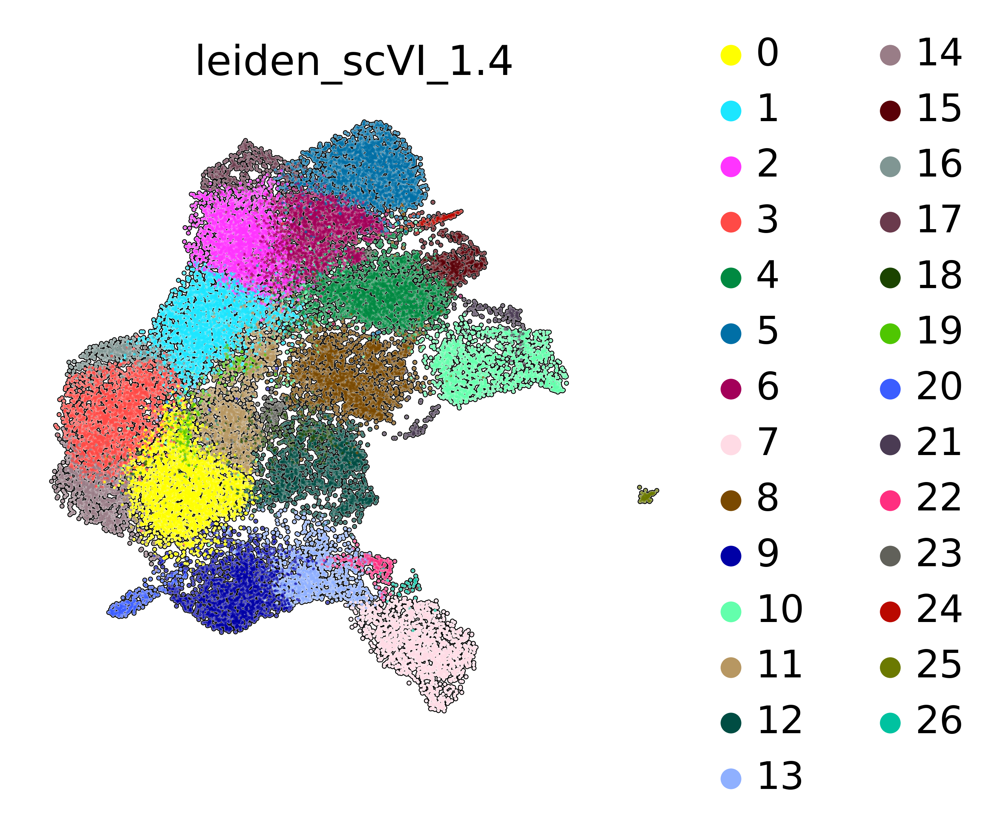

In [15]:
sc.tl.leiden(adata, key_added="leiden_scVI_1.4", resolution=1.4)
sc.pl.umap(
    adata,
    color=["leiden_scVI_1.4"],
    frameon=False, palette=sc.pl.palettes.default_102, add_outline=True, legend_fontoutline=0
)

In [42]:
label_mapping = {
    "0": "Early upper",
    "1": "Reticular/Hypodermal",
    "2": "Reticular/Interstitial",
    "3": "Papillary",
    "4": "Pre-adipo/Fascia",
    "5": "Reticular/Interstitial",
    "6": "Reticular/Interstitial",
    "7": "DC/DP",
    "8": "Reticular/Hypodermal",
    "9": "MEF2C+ upper",
    "10": "Early lower(PCW7)",
    "11": "Early upper",
    "12": "Early upper",
    "13": "Dermal condensate",
    "14": "Papillary",
    "15": "Pre-adipo/Fascia",
    "16": "Papillary",
    "17": "Reticular/Interstitial",
    "18": "Early upper",
    "19": "Early upper",
    "20": "APM",
    "21": "Early lower(PCW7)",
    "22": "Dermal sheath",
    "23": "Early upper",
    "24": "Pre-adipo/Fascia",
    "25": "UD(CD45+)",
    "26": "DC/DP"
}

adata.obs["new_label2"] = adata.obs["leiden_scVI_1.4"].astype(str).map(label_mapping)

adata.obs[["leiden_scVI_1.4", "new_label2"]].head()

,leiden_scVI_1.4,new_label2
index1,,
AGCCTAACAGACACTT-1-FCAImmP7803043,0,Early upper
ACCCACTGTCTAGAGG-1-FCAImmP7964508,6,Reticular/Interstitial
CCTACACGTGTTCGAT-1-FCAImmP7964508,12,Early upper
CGGACGTAGGACAGAA-1-FCAImmP7964509,2,Reticular/Interstitial
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497,2,Reticular/Interstitial


In [76]:
sc.set_figure_params(dpi=150)#, facecolor='white')

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/

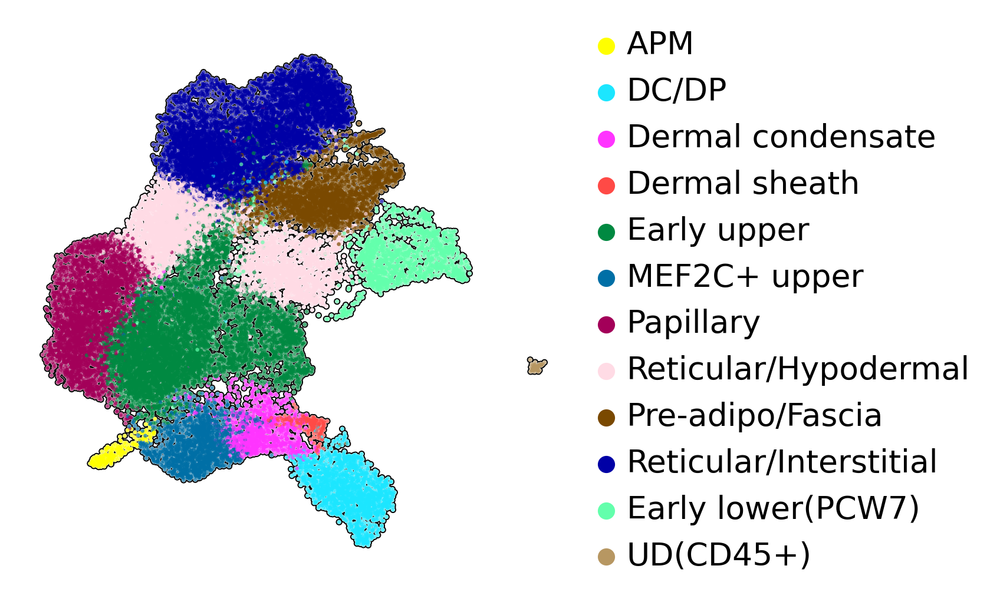

In [78]:
sc.pl.umap(
    adata,
    color=["new_label2"], palette=sc.pl.palettes.default_102, size=10, title="", save="250328_UMAP.new_label.svg",
    frameon=False, add_outline=True,
)

### Matrix with new label

In [45]:
adata.obs["new_label2"]

index1
AGCCTAACAGACACTT-1-FCAImmP7803043                  Early upper
ACCCACTGTCTAGAGG-1-FCAImmP7964508       Reticular/Interstitial
CCTACACGTGTTCGAT-1-FCAImmP7964508                  Early upper
CGGACGTAGGACAGAA-1-FCAImmP7964509       Reticular/Interstitial
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497    Reticular/Interstitial
                                                 ...          
GCGCAGTTCTTAGAGC-1-FCAImmP7579213                    Papillary
CCTTTCTAGCAACGGT-1-FCAImmP7241241                  Early upper
GGCCGATCATCACGTA-1-FCAImmP7803026         Reticular/Hypodermal
GTAACGTAGTTACGGG-1-WS_wEMB13942143                   Papillary
GCGCAGTTCAGCGATT-1-FCAImmP7803043            Dermal condensate
Name: new_label2, Length: 30716, dtype: category
Categories (12, object): ['APM', 'DC/DP', 'Dermal condensate', 'Dermal sheath', ..., 'Pre-adipo/Fascia', 'Reticular/Hypodermal', 'Reticular/Interstitial', 'UD(CD45+)']

In [46]:
adata.obs["new_label2"] = pd.Categorical(adata.obs['new_label2'])

In [47]:
new_order = ['APM', 'DC/DP', 'Dermal condensate', 'Dermal sheath', 'Early upper', 'MEF2C+ upper', 'Papillary', 'Reticular/Hypodermal', 'Pre-adipo/Fascia', 'Reticular/Interstitial', 'Early lower(PCW7)', 'UD(CD45+)'
]

In [48]:
adata.obs["new_label2"] = adata.obs["new_label2"].cat.reorder_categories(new_order, ordered=True)


In [49]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300)

In [54]:
markers=['ACTG2', 'MYOCD', 'MEF2C', 'SOX2', 'CXCR4', 'ALX4', 'COL23A1', 'SOX18', 'COL11A1', 'CD200', 'CRABP1', 'TWIST2', 'PDGFRA', 'COL13A1', 'APCDD1', 'DLK1',  'MEOX2', 'EBF2', 'MFAP5', 'IFITM1', 'PTPRC' ]

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/scanpy/plotting/_do

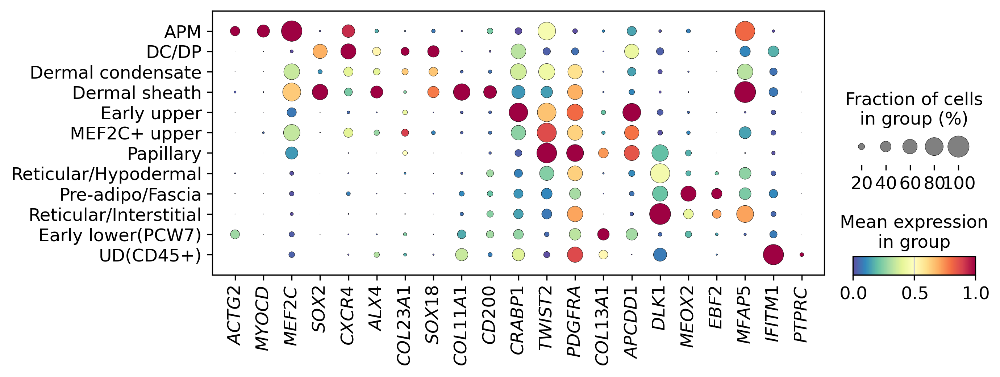

In [79]:
sc.pl.dotplot(
    adata,
    markers,
    groupby='new_label2',
    use_raw=False,
    cmap='Spectral_r',
    figsize=(9,3.2),
    #layer='scaled',
    show=False, standard_scale="var"  
    
)

fig = plt.gcf()

for ax in fig.axes:
    tick_labels = [tick.get_text() for tick in ax.get_xticklabels()]
    italic_labels = [f"$\\mathit{{{label}}}$" for label in tick_labels]
    ax.set_xticklabels(italic_labels, )

fig.savefig("250328.fetus_relabel_dotplot.variance.svg", dpi=300, format="svg", bbox_inches="tight")
plt.show()

In [56]:
categories = adata.obs['new_label2'].cat.categories
print("Categories:", categories)
if 'new_label_colors' in adata.uns:
    colors = adata.uns['new_label2_colors']
    print("Assigned colors:", colors)
else:
    print("No color mapping found in adata.uns for 'new_label2'.")

Categories: Index(['APM', 'DC/DP', 'Dermal condensate', 'Dermal sheath', 'Early upper',
       'MEF2C+ upper', 'Papillary', 'Reticular/Hypodermal', 'Pre-adipo/Fascia',
       'Reticular/Interstitial', 'Early lower(PCW7)', 'UD(CD45+)'],
      dtype='object')
No color mapping found in adata.uns for 'new_label2'.


In [57]:
adata.uns['new_label2_colors']

['#ffff00',
 '#1ce6ff',
 '#ff34ff',
 '#ff4a46',
 '#008941',
 '#006fa6',
 '#a30059',
 '#ffdbe5',
 '#7a4900',
 '#0000a6',
 '#63ffac',
 '#b79762']

In [81]:
plt.rcParams["figure.figsize"] = [3, 5]

In [82]:
plt.rcParams["figure.dpi"] = 300

<Figure size 900x1500 with 0 Axes>

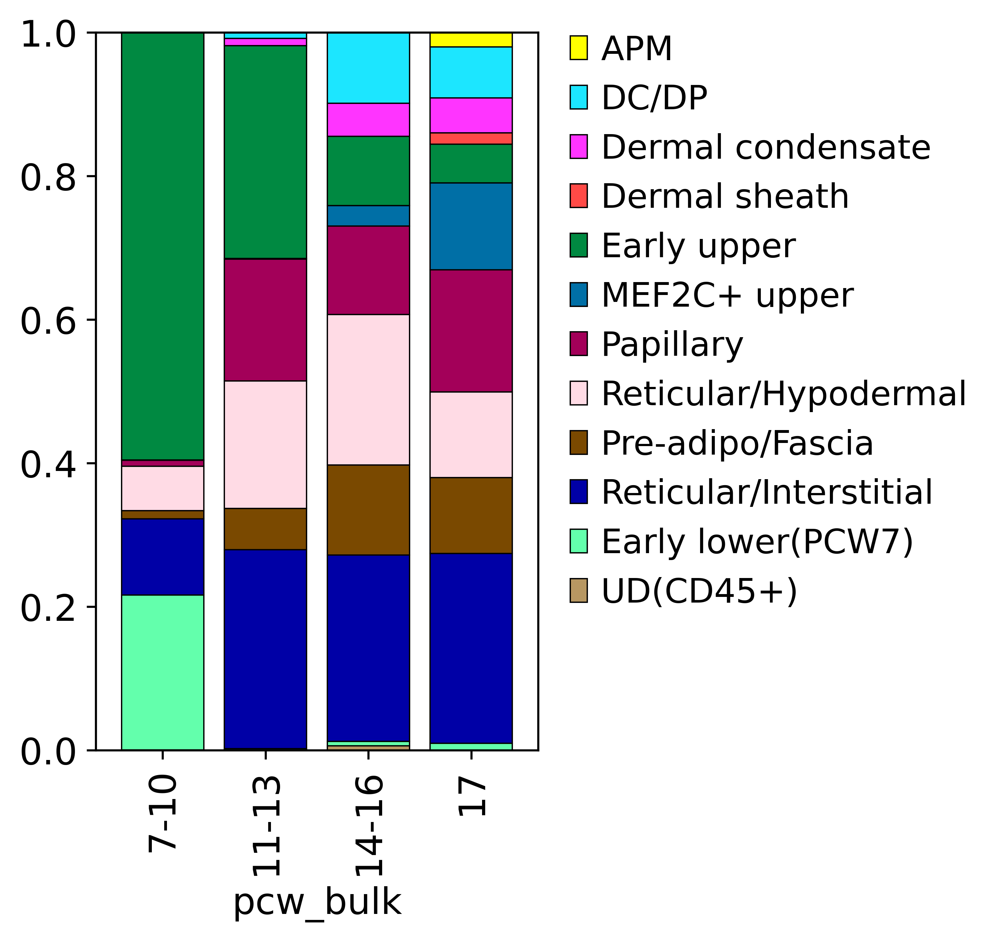

In [83]:
from matplotlib.pyplot import rc_context
from matplotlib import pyplot as plt

# Assuming your 'tmp' DataFrame is correctly set up as before
with rc_context():
    plt.figure()
    tmp = pd.crosstab(adata.obs['pcw_bulk'], adata.obs['new_label2'], normalize='index')
    tmp = tmp[tmp.columns[::-1]]
    
    tmp.plot.bar(stacked=True, width=0.80, color={
    "APM": "#FFFF00",
    "DC/DP": "#1CE6FF",
    "Dermal condensate": "#FF34FF",
    "Dermal sheath": "#FF4A46",
    "Early upper": "#008941",
    "MEF2C+ upper": "#006FA6",
    "Papillary": "#A30059",
    "Reticular/Hypodermal": "#ffdbe5",
    "Pre-adipo/Fascia": "#7a4900",
    "Reticular/Interstitial": "#0000a6",
    "Early lower(PCW7)": "#63ffac",
    "UD(CD45+)": "#b79762"
    }, edgecolor='black', linewidth=0.5 )
    plt.grid(False)
    plt.legend(loc='upper right', bbox_to_anchor=(2.04, 1.04), reverse=True, frameon=False)
    plt.ylim(0,1)
    plt.savefig('250328.human.fibroblast.newlabel2.svg', dpi=300, bbox_inches='tight')
    plt.show()


In [62]:
adata

AnnData object with n_obs × n_vars = 30716 × 36601
    obs: 'sanger_id', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'index', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'QC', 'S_score', 'G2M_score', 'phase', 'joint_annotation_20220202', 'fig1b_annotation_v2', 'annotation_fine', 'annotation_verybroad', 'annotation_broad', 'celltype', 'pcw_bulk', 'leiden_scVI_1.4', 'new_label2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotation_broad_colors', 'annotation_broad_sizes', 'annotation_fine_colors', 'annotation_fine_manual_colors', 'anno

In [63]:
adata.X.toarray().max()

7.9566774

In [64]:
adata.layers['lognom'] = adata.X.copy()

In [65]:
adata.X = adata.layers['counts'].copy()

In [66]:
adata.write("250328.human.fibroblast.subset.newlabel.h5ad")

In [67]:
adata.obs['celltype'] = adata.obs['new_label2'].copy()

In [68]:
human = adata.copy()

In [69]:
# Ensure that pcw is numeric (if not already)
human.obs['pcw'] = human.obs['pcw'].astype(float)

def assign_pcw_bulk(p):
    if 7 <= p <= 10:
        return "7-10"
    elif 11 <= p <= 13:
        return "11-13"
    elif 14 <= p <= 16:
        return "14-16"
    elif p == 17:
        return "17"
    else:
        return str(p)  # fallback in case of unexpected value

# Create the new pcw_bulk column
human.obs['pcw_bulk'] = human.obs['pcw'].apply(assign_pcw_bulk)

# Now update the celltype using pcw_bulk
# Option 1: Overwrite the existing celltype column:
human.obs['celltype'] = human.obs['pcw_bulk'] + "_" + human.obs['celltype'].astype(str)

# Option 2: Or create a new column (e.g., 'new_celltype'):
# human.obs['new_celltype'] = human.obs['pcw_bulk'] + "_" + human.obs['celltype'].astype(str)

# Check the result
print(human.obs[['pcw', 'pcw_bulk', 'celltype']].head())

                                       pcw pcw_bulk  \
index1                                                
AGCCTAACAGACACTT-1-FCAImmP7803043     15.0    14-16   
ACCCACTGTCTAGAGG-1-FCAImmP7964508     14.0    14-16   
CCTACACGTGTTCGAT-1-FCAImmP7964508     14.0    14-16   
CGGACGTAGGACAGAA-1-FCAImmP7964509     14.0    14-16   
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497  14.0    14-16   

                                                          celltype  
index1                                                              
AGCCTAACAGACACTT-1-FCAImmP7803043                14-16_Early upper  
ACCCACTGTCTAGAGG-1-FCAImmP7964508     14-16_Reticular/Interstitial  
CCTACACGTGTTCGAT-1-FCAImmP7964508                14-16_Early upper  
CGGACGTAGGACAGAA-1-FCAImmP7964509     14-16_Reticular/Interstitial  
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497  14-16_Reticular/Interstitial  


In [70]:
human.obs['celltype']

index1
AGCCTAACAGACACTT-1-FCAImmP7803043                  14-16_Early upper
ACCCACTGTCTAGAGG-1-FCAImmP7964508       14-16_Reticular/Interstitial
CCTACACGTGTTCGAT-1-FCAImmP7964508                  14-16_Early upper
CGGACGTAGGACAGAA-1-FCAImmP7964509       14-16_Reticular/Interstitial
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497    14-16_Reticular/Interstitial
                                                    ...             
GCGCAGTTCTTAGAGC-1-FCAImmP7579213                    11-13_Papillary
CCTTTCTAGCAACGGT-1-FCAImmP7241241                   7-10_Early upper
GGCCGATCATCACGTA-1-FCAImmP7803026         14-16_Reticular/Hypodermal
GTAACGTAGTTACGGG-1-WS_wEMB13942143                      17_Papillary
GCGCAGTTCAGCGATT-1-FCAImmP7803043            14-16_Dermal condensate
Name: celltype, Length: 30716, dtype: object

In [72]:
print(adata.X)

  (0, 24)	3.0
  (0, 44)	1.0
  (0, 51)	1.0
  (0, 53)	1.0
  (0, 58)	2.0
  (0, 59)	1.0
  (0, 60)	3.0
  (0, 62)	1.0
  (0, 84)	1.0
  (0, 104)	2.0
  (0, 105)	2.0
  (0, 167)	1.0
  (0, 170)	42.0
  (0, 187)	1.0
  (0, 189)	1.0
  (0, 208)	1.0
  (0, 216)	2.0
  (0, 219)	2.0
  (0, 227)	1.0
  (0, 247)	2.0
  (0, 256)	1.0
  (0, 271)	1.0
  (0, 279)	1.0
  (0, 280)	4.0
  (0, 285)	1.0
  :	:
  (30715, 36101)	3.0
  (30715, 36113)	1.0
  (30715, 36114)	1.0
  (30715, 36152)	2.0
  (30715, 36159)	2.0
  (30715, 36190)	4.0
  (30715, 36205)	2.0
  (30715, 36372)	1.0
  (30715, 36377)	2.0
  (30715, 36400)	1.0
  (30715, 36401)	19.0
  (30715, 36406)	1.0
  (30715, 36412)	1.0
  (30715, 36429)	1.0
  (30715, 36443)	1.0
  (30715, 36559)	6.0
  (30715, 36561)	2.0
  (30715, 36562)	2.0
  (30715, 36563)	14.0
  (30715, 36564)	3.0
  (30715, 36565)	9.0
  (30715, 36566)	5.0
  (30715, 36567)	6.0
  (30715, 36568)	2.0
  (30715, 36571)	4.0


In [73]:
human.obs['celltype']

index1
AGCCTAACAGACACTT-1-FCAImmP7803043                  14-16_Early upper
ACCCACTGTCTAGAGG-1-FCAImmP7964508       14-16_Reticular/Interstitial
CCTACACGTGTTCGAT-1-FCAImmP7964508                  14-16_Early upper
CGGACGTAGGACAGAA-1-FCAImmP7964509       14-16_Reticular/Interstitial
AAGACCTAGCGGATCA-1-HCA_rFSKI14539497    14-16_Reticular/Interstitial
                                                    ...             
GCGCAGTTCTTAGAGC-1-FCAImmP7579213                    11-13_Papillary
CCTTTCTAGCAACGGT-1-FCAImmP7241241                   7-10_Early upper
GGCCGATCATCACGTA-1-FCAImmP7803026         14-16_Reticular/Hypodermal
GTAACGTAGTTACGGG-1-WS_wEMB13942143                      17_Papillary
GCGCAGTTCAGCGATT-1-FCAImmP7803043            14-16_Dermal condensate
Name: celltype, Length: 30716, dtype: object

In [74]:
human.write("250328.human.fibroblast.subset.newlabel.timepoint.h5ad")

In [3]:
adata = sc.read("250328.human.fibroblast.subset.newlabel.h5ad")

Only considering the two last: ['.newlabel', '.h5ad'].
Only considering the two last: ['.newlabel', '.h5ad'].


/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/rpy_base_240331_pertpy/lib/python3.11/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [5]:
adata.X = adata.layers['lognom'].copy()
print(adata.X)

  (0, 24)	0.9980959296226501
  (0, 44)	0.4517359137535095
  (0, 51)	0.4517359137535095
  (0, 53)	0.4517359137535095
  (0, 58)	0.7617745399475098
  (0, 59)	0.4517359137535095
  (0, 60)	0.9980959296226501
  (0, 62)	0.4517359137535095
  (0, 84)	0.4517359137535095
  (0, 104)	0.7617745399475098
  (0, 105)	0.7617745399475098
  (0, 167)	0.4517359137535095
  (0, 170)	3.2182178497314453
  (0, 187)	0.4517359137535095
  (0, 189)	0.4517359137535095
  (0, 208)	0.4517359137535095
  (0, 216)	0.7617745399475098
  (0, 219)	0.7617745399475098
  (0, 227)	0.4517359137535095
  (0, 247)	0.7617745399475098
  (0, 256)	0.4517359137535095
  (0, 271)	0.4517359137535095
  (0, 279)	0.4517359137535095
  (0, 280)	1.1891072988510132
  (0, 285)	0.4517359137535095
  :	:
  (30715, 36101)	2.4006271362304688
  (30715, 36113)	1.4686490297317505
  (30715, 36114)	1.4686490297317505
  (30715, 36152)	2.0394949913024902
  (30715, 36159)	2.0394949913024902
  (30715, 36190)	2.6653828620910645
  (30715, 36205)	2.0394949913024902
 

In [9]:
adata.obs["new_label"] = adata.obs["new_label2"].copy()

In [11]:
del adata.obs['new_label2']

In [12]:
del adata.obs['celltype']

In [13]:
del adata.obs['leiden_scVI_1.4']

In [14]:
adata.write("250328.human.fibroblast.subset.newlabel_forshiny.h5ad")